In [3]:
import torch
import torchvision.models as models
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import os
import cv2
import json
import math
import torch
import random
import numpy as np
from PIL import Image
from tqdm import tqdm
import torch.nn as nn
import tensorflow as tf
import torch.optim as optim
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from torchvision import transforms
import torchvision
import torchvision.transforms.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn, fasterrcnn_resnet50_fpn_v2

# Define the model architecture (e.g., Faster R-CNN with ResNet-50 backbone)
model = models.detection.fasterrcnn_resnet50_fpn(num_classes = 3, pretrained=False)

c:\Users\troggy\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\troggy\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [4]:
class CustomBackbone(nn.Module):
    def __init__(self):
        super(CustomBackbone, self).__init__()
        # Define your custom backbone layers here
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        return x

def get_model(num_classes, pretrained):
    """
    Create the model object.
    Arguments:
    ---------
        - num_classes(int): Number of classes.
        - pretrained(bool): Whether to use pretrained weights or not.
    Return:
    ---------
        - model(torch.nn.Module): Faster R-CNN model
    """
    
    backbone = CustomBackbone()
    backbone.out_channels = 256  # This should match the output channels of your custom backbone
    
    # RPN (Region Proposal Network)
    rpn_anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128, 256, 512),),
        aspect_ratios=((0.5, 1.0, 2.0),)
    )
    
    # ROI Pooling
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(
        featmap_names=['0'], output_size=7, sampling_ratio=2
    )
    
    model = FasterRCNN(
        backbone,
        num_classes=num_classes,
        rpn_anchor_generator=rpn_anchor_generator,
        box_roi_pool=roi_pooler
    )
    
    return model

In [5]:
checkpoint_path = '../model_this/custom_backbone_60_fr.pth'
checkpoint = torch.load(checkpoint_path)
num_classes = 3
model = get_model(num_classes, pretrained = True)
# Load the model state dictionary
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [6]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): CustomBackbone(
    (layer1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (layer2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (layer3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (rpn): RegionProposalNetwork(
    (anchor_generator): AnchorGenerator()
    (head): RPNHead(
    

In [7]:
device = torch.device("cpu")
print(f"Using device: {device}")

Using device: cpu


In [8]:
class CFG:
    
    train_batch_size = 4
    test_batch_size = 1
    
    lr = 0.0001
    lr_finetune = 0.0005
    weight_decay = 1e-4
    
    epochs = 20
    epochs_finetune = 15

cfg = CFG()

In [9]:
train_img_path = '../../data/coco/train'
train_label_file = '../../data/coco/train/_annotations.coco.json'
test_img_path = '../../data/coco/test'
test_label_file = '../../data/coco/test/_annotations.coco.json'
valid_img_path = '../../data/coco/valid'
valid_label_file = '../../data/coco/valid/_annotations.coco.json'


In [10]:
with open(test_label_file) as json_file:
    test_data_dict = json.load(json_file)
with open(valid_label_file) as json_file:
    valid_data_dict = json.load(json_file)

In [11]:
test_data_dict['annotations'][0]

{'id': 0,
 'image_id': 1,
 'category_id': 2,
 'bbox': [190, 284, 90, 155],
 'area': 13950,
 'segmentation': [],
 'iscrowd': 0}

In [12]:
cat_mapping = dict() # Variable that maps class id -> class name
for category in test_data_dict['categories']:
    cat_mapping[category['id']] = category['name']

In [13]:
class Compose(object):
    def __init__(self, transforms):
        '''
        Arguments:
        -----------
            - transforms(list): list of augmentation classes objects
        Return:
        ---------
            None
        '''
        self.transforms = transforms

    def __call__(self, image, bboxes):
        '''
        Function that iterates data through all the augmentations in the augmentation list.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(PIL.Image.Image): Image after all augmentations.
            - bboxes(torch.Tensor): Bounding boxes related to the image after all augmentations.
        '''
        for t in self.transforms:
            image, bboxes = t(image, bboxes)
        return image, bboxes

    
class RandomHorizontalFlip(object):
    def __init__(self, p=0.5):
        '''
        Arguments:
        -----------
            - p(float): probability of the augmentation being applied
        Return:
        ---------
            None
        '''
        self.p = p

    def __call__(self, image, bboxes):
        '''
        Function that applies the horizontal flip.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(PIL.Image.Image): Image after horizontal flip.
            - bboxes(torch.Tensor): Bounding boxes related to the image after horizontal flip.
        '''
        if random.random() < self.p:
            image = F.hflip(image)
            width, _ = image.size
            if len(bboxes)!=0:
                bboxes = bboxes.clone()
                bboxes[:, [0, 2]] = width - bboxes[:, [2, 0]]  # Flip x_min and x_max
        return image, bboxes

    
class ToTensor(object):
    def __call__(self, image, bboxes):
        '''
        Function that transforms data into torch.Tensor type.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(torch.Tensor): Image as a pytorch tensor.
            - bboxes(torch.Tensor): Bounding boxes that are not changed.
        '''
        image = F.to_tensor(image)
        return image, bboxes

In [14]:
train_transform = Compose([
            RandomHorizontalFlip(p=0.5),
            ToTensor()
        ])

val_transform = Compose([
            ToTensor()
        ])

test_transform = val_transform

In [15]:
class CSGODataset(Dataset):
    def __init__(self, img_path, data_dict, transform=None):
        '''
        Arguments:
        -----------
            - images(np.ndarray): Array containing all images (X)
            - labels(np.ndarray): Array containing the targets (y)
            - lb(sklearn.preprocessing._label.LabelBinarizer): Label Binarizer to transform labels into one-hot vectors
            - transform(torchvision.transforms.transforms.Compose|None): Variable containing all transformations data has to go through
        Return:
        ---------
            None
        '''
        self.img_path = img_path
        self.data_dict = data_dict
        self.transform = transform
        self.dataset = self.create_dataset()
    
    def create_dataset(self):
        """
        Function to create dataset list, by pairing each image path to all the annotations in that image.
        Arguments:
        ---------
            None
        Return:
        ---------
            - dataset(list[list[str,dict]]): List containing the all the needed information related to the dataset.
        """
        dataset = []
        for element in self.data_dict["images"]:
            img_id = element['id']
            img_annotations = []
            for annotation in self.data_dict['annotations']:
                if annotation['image_id'] == img_id:
                    img_annotations.append(annotation)
            dataset.append([element['file_name'], img_annotations])
        
        return dataset
    
    def __len__(self):
        """
        Arguments:
        ---------
            None
        Return:
        ---------
            None
        """
        return len(self.data_dict['images'])
    
    def collate_fn(self, batch):
        """
        Since each image may have a different number of objects,
        we need a collate function (to be passed to the DataLoader).
        
        Arguments:
        ---------
            - batch: an iterable of N sets from __getitem__()
        Return:
        ---------
            - images(torch.Tensor): a tensor of batch_size images
            - boxes(list[torch.Tensor]): list with batch_size varying-size tensors of bounding boxes
            - labels(list[torch.Tensor]): list with batch_size varying-size tensors of labels
            - areas(list[torch.Tensor]): list with batch_size varying-size tensors of areas
            - image_id(list[torch.Tensor]): list with batch_size varying-size tensors of image ids
        """
        images = list()
        boxes = list()
        labels = list()
        areas = list()
        image_id = list()

        for b in batch:
            images.append(b[0])
            boxes.append(b[1])
            labels.append(b[2])
            areas.append(b[3])
            image_id.append(b[4])

        images = torch.stack(images, dim=0)

        return images, boxes, labels, areas, image_id
    
    def __getitem__(self, idx):
        """
        Arguments:
        ---------
            - idx (int): Index for selecting a sample from the dataset
        Return:
        ---------
            - img(torch.Tensor): Single image.
            - bbs(torch.Tensor): Bounding boxes related to the image.
            - cat_ids(torch.Tensor): Labels corresponding to each bounding box in the image.
            - areas(torch.Tensor): Areas of each bounding box.
            - image_id(torch.Tensor): Image ID related to each bounding box. Since all bounding boxes are from the same image, image_id is a tensor with all equal values.
        """
        
        img = cv2.imread(os.path.join(self.img_path, self.dataset[idx][0]))
        #img = img.reshape().astype(np.uint8)
            
        cat_ids = []
        bbs = []
        areas = []
        iscrowd = []
        image_id = []
        for annotation in self.dataset[idx][1]:
            cat_ids.append(annotation['category_id'])
            bbs.append(annotation['bbox'])
            areas.append(annotation['area'])
            iscrowd.append(annotation['iscrowd'])
            image_id.append(annotation['image_id'])
        cat_ids = torch.Tensor(cat_ids)
        
        areas = torch.Tensor(areas)
        iscrowd = torch.Tensor(iscrowd)
        image_id = torch.Tensor(image_id)
        
        bbs = np.array(bbs)
        for i, bb in enumerate(bbs):
            x_min, y_min, width, height = bb
            x1, y1 = x_min, y_min
            x2, y2 = x_min + width, y_min + height
            bbs[i] = np.array([x1, y1, x2, y2])
        
        bbs = torch.Tensor(bbs)
        if self.transform:
            img = Image.fromarray(img)
            img, bbs = self.transform(img, bbs)
        
        bbs = torch.from_numpy(np.array(bbs))
        cat_ids = torch.Tensor(cat_ids).long()
        
        return img, bbs, cat_ids, areas, image_id

In [16]:
test_dataset = CSGODataset(test_img_path, test_data_dict, transform=test_transform)
test_dataloader = DataLoader(test_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=test_dataset.collate_fn)
valid_dataset = CSGODataset(valid_img_path, valid_data_dict, transform=test_transform)
valid_dataloader = DataLoader(valid_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=valid_dataset.collate_fn)


In [17]:
def calculate_iou(box1, box2):
    """
    Function that calculates IoU metric.
    Arguments:
    ---------
        - box1(np.ndarray|list): First bounding box in the format (x_min, y_min, x_max, y_max).
        - box2(np.ndarray|list): Second bounding box in the format (x_min, y_min, x_max, y_max).
    Return:
    ---------
        - iou(float): Intersection over Union metric from the two bounding boxes.
    """
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_area = max(0, inter_max_x - inter_min_x) * max(0, inter_max_y - inter_min_y)

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou

In [18]:
def plot_test_predictions(image, boxes, labels, scores, class_names, true_boxes, true_labels, image_id, iou_threshold=0.7):
    """
    Plot some of the test images with predicted bounding boxes and class names.
    Colors indicate if it was a right or wrong detection.
    
    Arguments:
    ---------
        - image(torch.Tensor): Batch of images.
        - boxes(torch.Tensor): Batch of predicted bounding boxes related to the images.
        - labels(torch.Tensor): Batch of predicted labels corresponding to each bounding box.
        - scores(torch.Tensor): Batch of predicted scores corresponding to each label.
        - class_names(dict): Dict that maps each label to a class name.
        - true_boxes(torch.Tensor): Batch of true (ground truth) bounding boxes related to the images.
        - true_labels(torch.Tensor): Batch of true (ground truth) labels corresponding to each bounding box.
        - image_id(torch.Tensor): Batch of image IDs related to each bounding box.
        - iou_threshold(float): Threshold used to verify if the predicted bounding box was in the right spot or not.
    Return:
    ---------
        None
    """
    image = image.permute(1, 2, 0).numpy()
    image = (image * 255).astype(np.uint8) # Convert back to [0, 255] range
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    correct = 0.0
    bbox_correct = 0.0
    class_correct = 0.0
    total = 0.0
    for box, label, score in zip(boxes, labels, scores): # For each bounding box and label found in the image
        x1, y1, x2, y2 = map(int, box)
        match = False
        match_bb = False
        total += 1
        for true_box, true_label in zip(true_boxes, true_labels):
            if calculate_iou(box, true_box) >= iou_threshold and label == true_label: # Bounding Box and class right
                match = True
            elif calculate_iou(box, true_box) >= iou_threshold: # Bounding Box right but class wrong
                match_bb = True
        
        text = f'{class_names[int(label)]}: {score:.2f}'
        if match:
            green = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=green, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=green, thickness=2)
            correct += 1
            bbox_correct += 1
            class_correct += 1
        elif match_bb:
            blue = (0, 0, 255)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=blue, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=blue, thickness=2)
            correct += .5
            bbox_correct += 1
        else:
            red = (255, 0, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=red, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=red, thickness=2)
    plt.title(f'Image {int(image_id[0])}')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

  

In [19]:
def get_Predictions(dataloader):
    i = 0
    for images, bbs, labels, areas, image_id in dataloader:
        
        images = images.float().to(device)
        if(i !=0  and len(image_id) > 0):
            with torch.no_grad():
                prediction = model(images)
                
            pred_boxes = prediction[0]['boxes'].cpu().numpy()
            true_boxes = bbs[0].numpy()
            pred_labels = prediction[0]['labels'].cpu().numpy()
            true_labels = labels[0].numpy()
            pred_scores = prediction[0]['scores'].cpu().numpy()
            pred_boxes = pred_boxes[pred_scores >= 0.11].tolist()
            pred_labels = pred_labels[pred_scores >= 0.11].tolist()
            pred_scores = pred_scores[pred_scores >= 0.11].tolist()

            images = images.cpu().detach()
    
            plot_test_predictions(images[0], pred_boxes, pred_labels, pred_scores, cat_mapping, true_boxes, true_labels, image_id[0])
        i = i + 1

In [20]:
import torch
print(torch.__version__)

2.3.1+cu121


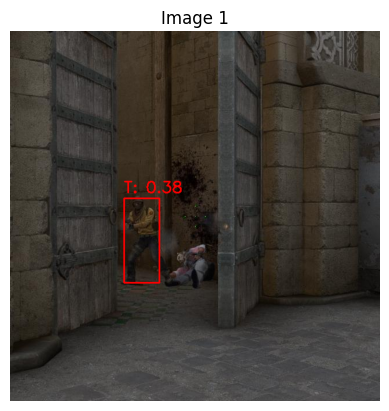

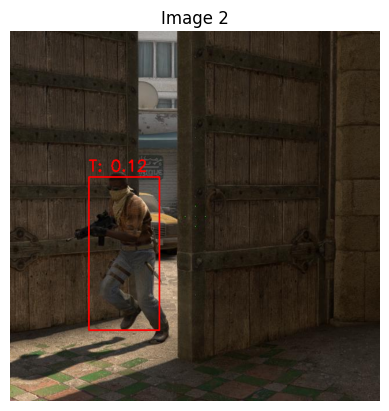

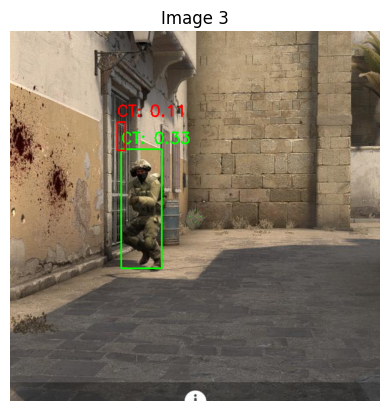

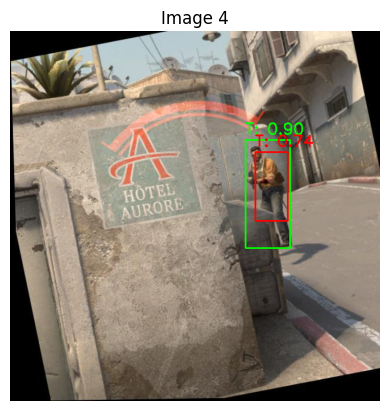

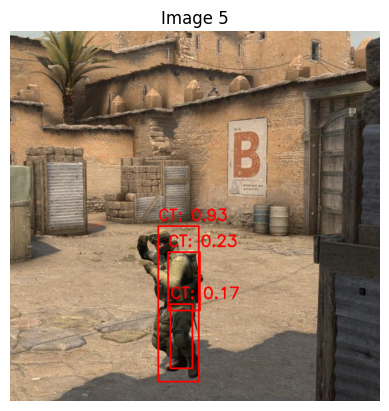

...

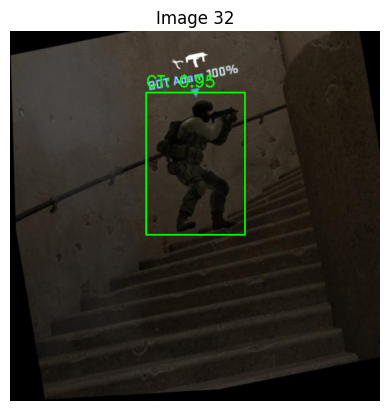

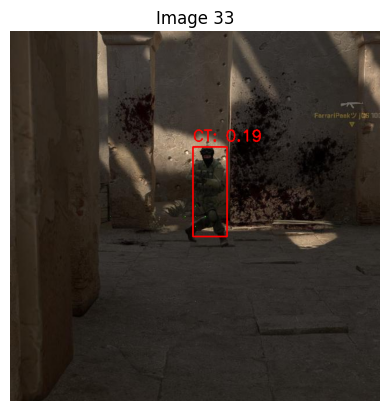

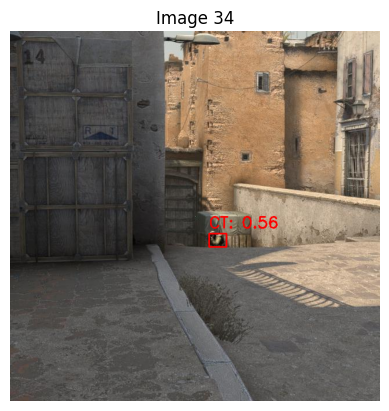

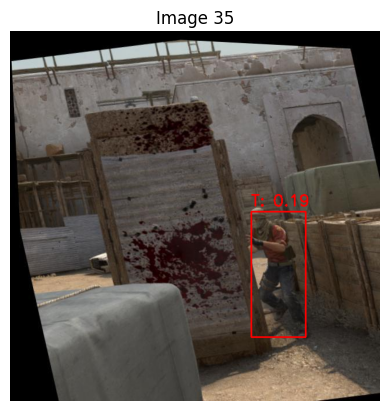

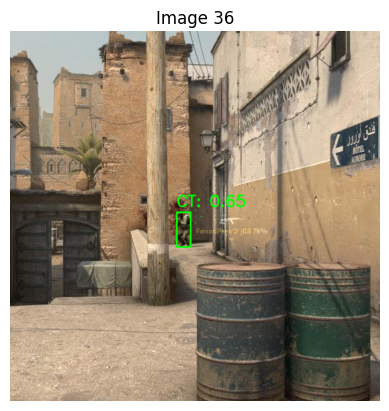

In [21]:
get_Predictions(test_dataloader)

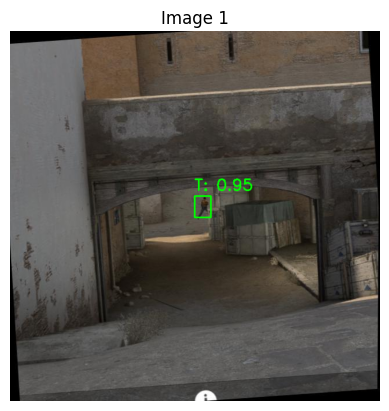

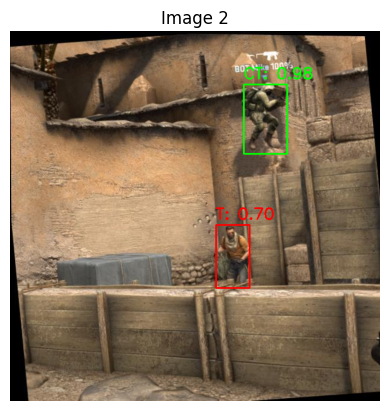

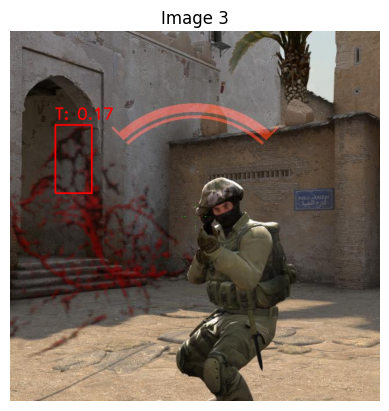

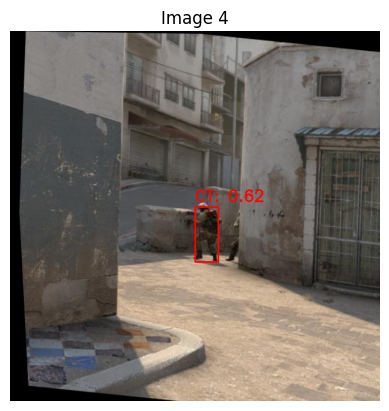

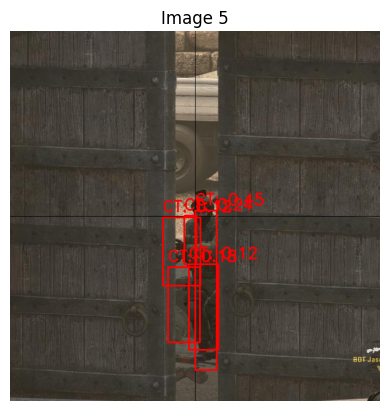

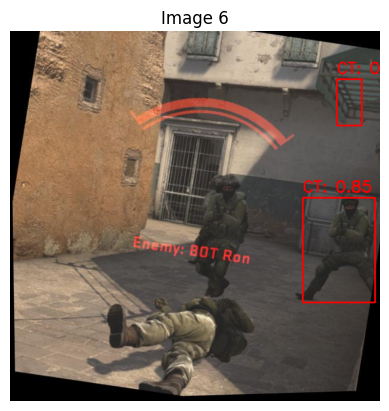

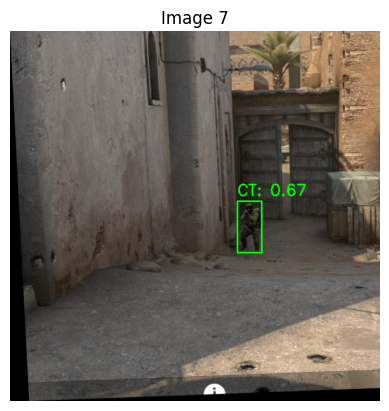

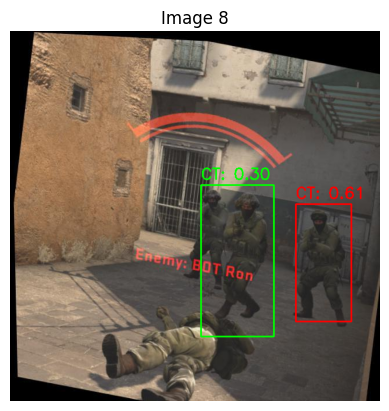

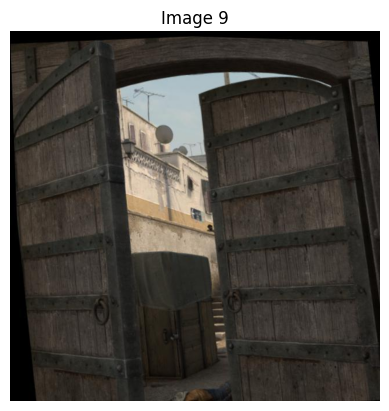

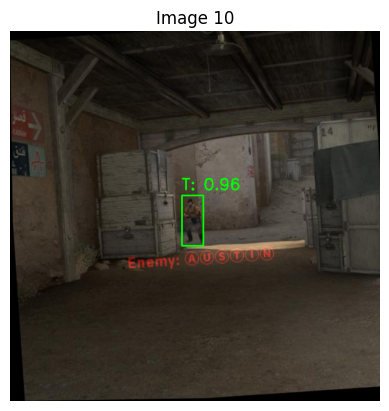

IndexError: index 0 is out of bounds for dimension 0 with size 0

In [22]:
get_Predictions(valid_dataloader)